
# **<center><font style="color:rgb(100,109,254)">Human Action Recognition in Videos using Keras (CNN + LSTM)</font> </center>**

<center>
<img src='https://drive.google.com/uc?export=download&id=1ucdFpzyVbzTa7kPYsJ2av-gRKgd84ICA'></center>

### **<font style="color:rgb(134,19,348)"> Import the Libraries</font>**



In [1]:

%%capture


!pip install youtube-dl moviepy
!pip install git+https://github.com/TahaAnwar/pafy.git#egg=pafy

In [2]:

import os
import cv2
import pafy
import math
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [3]:


seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

In [4]:

%%capture


!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar


!unrar x UCF50.rar

## **<font style="color:rgb(134,19,348)">Step 1: Visualize the Data with its Labels</font>**

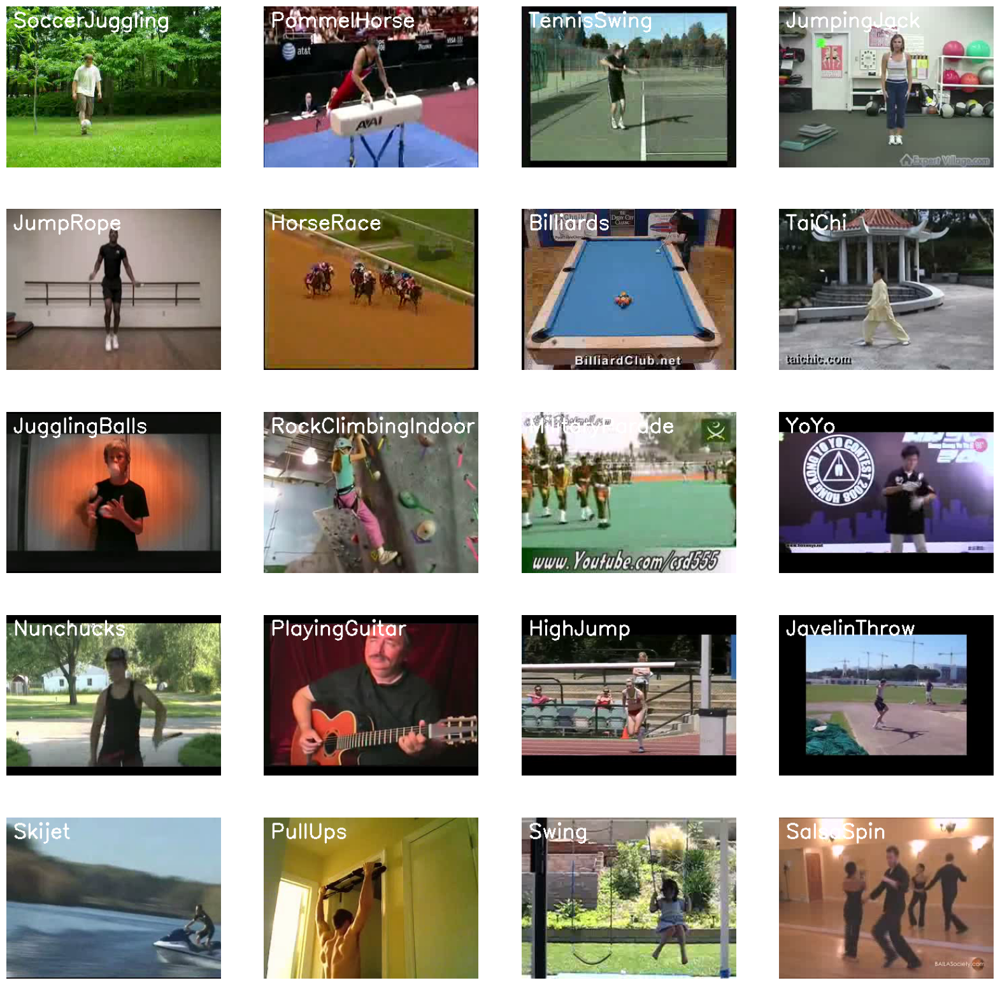

In [6]:

plt.figure(figsize = (20, 20))


all_classes_names = os.listdir('D:\\HAR3\\UCF50\\UCF50\\')

random_range = random.sample(range(len(all_classes_names)), 20)


for counter, random_index in enumerate(random_range, 1):


    selected_class_Name = all_classes_names[random_index]


    video_files_names_list = os.listdir(f'D:\\HAR3\\UCF50\\UCF50\\{selected_class_Name}')


    selected_video_file_name = random.choice(video_files_names_list)


    video_reader = cv2.VideoCapture(f'D:\\HAR3\\UCF50\\UCF50\\{selected_class_Name}/{selected_video_file_name}')


    _, bgr_frame = video_reader.read()


    video_reader.release()


    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)


    plt.subplot(5, 4, counter);plt.imshow(rgb_frame);plt.axis('off')

## **<font style="color:rgb(134,19,348)">Step 2: Preprocess the Dataset</font>**

In [11]:

IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64


SEQUENCE_LENGTH = 20


DATASET_DIR = "D:\\HAR3\\UCF50\\UCF50\\"


CLASSES_LIST = ["WalkingWithDog", "TaiChi", "Swing", "HorseRace","Fencing","Biking","PlayingPiano","Skiing"]


### **<font style="color:rgb(134,19,348)">Create a Function to Extract, Resize & Normalize Frames</font>**

In [12]:
def frames_extraction(video_path):



    frames_list = []


    video_reader = cv2.VideoCapture(video_path)


    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))


    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)


    for frame_counter in range(SEQUENCE_LENGTH):


        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)


        success, frame = video_reader.read()


        if not success:
            break


        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))


        normalized_frame = resized_frame / 255


        frames_list.append(normalized_frame)


    video_reader.release()


    return frames_list

### **<font style="color:rgb(134,19,348)">Create a Function for Dataset Creation</font>**

In [13]:
def create_dataset():



    features = []
    labels = []
    video_files_paths = []


    for class_index, class_name in enumerate(CLASSES_LIST):


        print(f'Extracting Data of Class: {class_name}')


        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))


        for file_name in files_list:


            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)


            frames = frames_extraction(video_file_path)


            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)


    features = np.asarray(features)
    labels = np.array(labels)


    return features, labels, video_files_paths

In [14]:

features, labels, video_files_paths = create_dataset()

Extracting Data of Class: WalkingWithDog
Extracting Data of Class: TaiChi
Extracting Data of Class: Swing
Extracting Data of Class: HorseRace
Extracting Data of Class: Fencing
Extracting Data of Class: Biking
Extracting Data of Class: PlayingPiano
Extracting Data of Class: Skiing


In [15]:

one_hot_encoded_labels = to_categorical(labels)

## **<font style="color:rgb(134,19,348)">Step 3: Split the Data into Train and Test Set</font>**

In [16]:

features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                            test_size = 0.25, shuffle = True,
                                                                            random_state = seed_constant)

## **<font style="color:rgb(134,19,348)">Step 4: Implement the ConvLSTM Approach</font>**

In [17]:
def create_convlstm_model():



    model = Sequential()



    model.add(ConvLSTM2D(filters = 4, kernel_size = (3, 3), activation = 'tanh',data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True, input_shape = (SEQUENCE_LENGTH,
                                                                                      IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 8, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 14, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters = 16, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))

    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))


    model.add(Flatten())

    model.add(Dense(len(CLASSES_LIST), activation = "softmax"))




    model.summary()


    return model

In [18]:

convlstm_model = create_convlstm_model()


print("Model Created Successfully!")

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_lstm2d (ConvLSTM2D)        │ (None, 20, 62, 62, 4)  │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d (MaxPooling3D)    │ (None, 20, 31, 31, 4)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 20, 31, 31, 4)  │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_1 (ConvLSTM2D)      │ (None, 20, 29, 29, 8)  │         3,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_1 (MaxPooling3D)  │ (None, 20, 15, 15, 8)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_1              │ (None, 20, 15, 15, 8)  │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_2 (ConvLSTM2D)      │ (None, 20, 13, 13, 14) │        11,144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_2 (MaxPooling3D)  │ (None, 20, 7, 7, 14)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_2              │ (None, 20, 7, 7, 14)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_lstm2d_3 (ConvLSTM2D)      │ (None, 20, 5, 5, 16)   │        17,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling3d_3 (MaxPooling3D)  │ (None, 20, 3, 3, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2880)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 8)              │        23,048 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 56,048 (218.94 KB)

 Trainable params: 56,048 (218.94 KB)

 Non-trainable params: 0 (0.00 B)

Model Created Successfully!


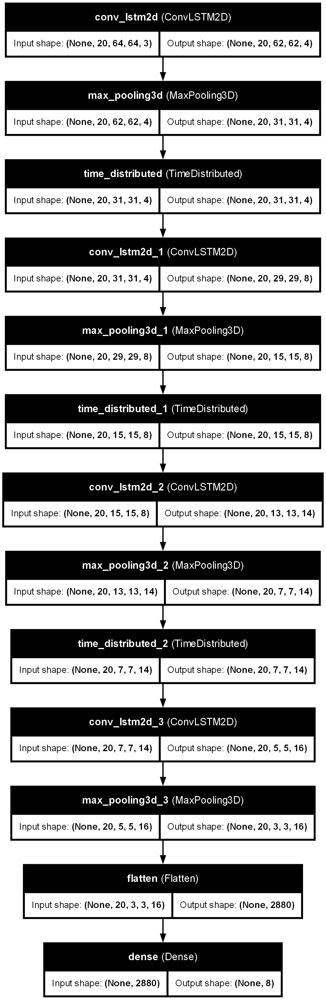

In [19]:

plot_model(convlstm_model, to_file = 'convlstm_model_structure_plot.png', show_shapes = True, show_layer_names = True)

In [20]:

early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 10, mode = 'min', restore_best_weights = True)


convlstm_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])


convlstm_model_training_history = convlstm_model.fit(x = features_train, y = labels_train, epochs = 10, batch_size = 4,
                                                     shuffle = True, validation_split = 0.2,
                                                     callbacks = [early_stopping_callback])

Epoch 1/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 88s 396ms/step - accuracy: 0.2442 - loss: 1.9306 - val_accuracy: 0.4228 - val_loss: 1.6395
Epoch 2/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 57s 380ms/step - accuracy: 0.4174 - loss: 1.5311 - val_accuracy: 0.5570 - val_loss: 1.2262
Epoch 3/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 58s 391ms/step - accuracy: 0.5711 - loss: 1.1903 - val_accuracy: 0.6309 - val_loss: 1.0590
Epoch 4/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 56s 379ms/step - accuracy: 0.6727 - loss: 0.9276 - val_accuracy: 0.6242 - val_loss: 1.0921
Epoch 5/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 56s 374ms/step - accuracy: 0.6992 - loss: 0.8396 - val_accuracy: 0.6711 - val_loss: 1.0210
Epoch 6/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 99s 668ms/step - accuracy: 0.7339 - loss: 0.6523 - val_accuracy: 0.6913 - val_loss: 1.1144
Epoch 7/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 81s 543ms/step - accuracy: 0.8144 - loss: 0.5321 - val_accuracy: 0.6107 - val_loss: 1.2444
Epoch 8/10
149/149 ━━━━━━━━━━━━━━━━━━━━ 66s 446ms/step - accuracy: 0.8195 - loss: 0

In [21]:

model_evaluation_history = convlstm_model.evaluate(features_test, labels_test)

8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 408ms/step - accuracy: 0.6672 - loss: 0.9588


In [22]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):



    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]


    epochs = range(len(metric_value_1))


    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)


    plt.title(str(plot_name))


    plt.legend()

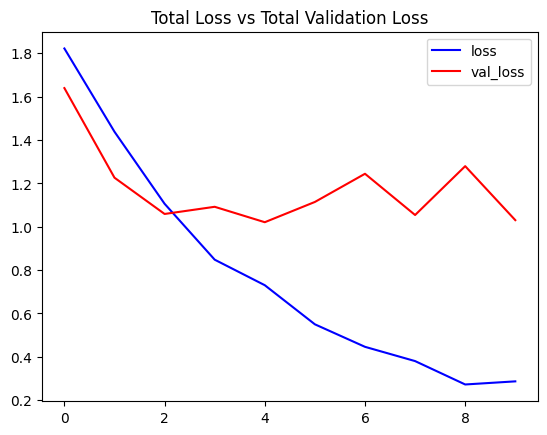

In [23]:

plot_metric(convlstm_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

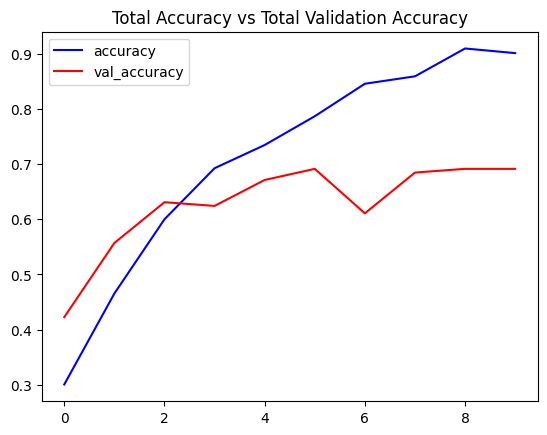

In [24]:

plot_metric(convlstm_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

## **<font style="color:rgb(134,19,348)">Step 5: Implement the LRCN Approach</font>**

In [26]:
def create_LRCN_model():



    model = Sequential()



    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                              input_shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))

    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    #model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Flatten()))

    model.add(LSTM(32))

    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))




    model.summary()


    return model

**<font style="color:rgb(134,19,348)">Step 4.1: Construct the Model</font>**


In [27]:

LRCN_model = create_LRCN_model()


print("Model Created Successfully!")

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed_3              │ (None, 20, 64, 64, 16) │           448 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_4              │ (None, 20, 16, 16, 16) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_5              │ (None, 20, 16, 16, 16) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_6              │ (None, 20, 16, 16, 32) │         4,640 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_7              │ (None, 20, 4, 4, 32)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_8              │ (None, 20, 4, 4, 32)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_9              │ (None, 20, 4, 4, 64)   │        18,496 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_10             │ (None, 20, 2, 2, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_11             │ (None, 20, 2, 2, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_12             │ (None, 20, 2, 2, 64)   │        36,928 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_13             │ (None, 20, 1, 1, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_14             │ (None, 20, 64)         │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 8)              │           264 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 73,192 (285.91 KB)

 Trainable params: 73,192 (285.91 KB)

 Non-trainable params: 0 (0.00 B)

Model Created Successfully!


#### **<font style="color:rgb(134,19,348)">Check Model’s Structure:</font>**

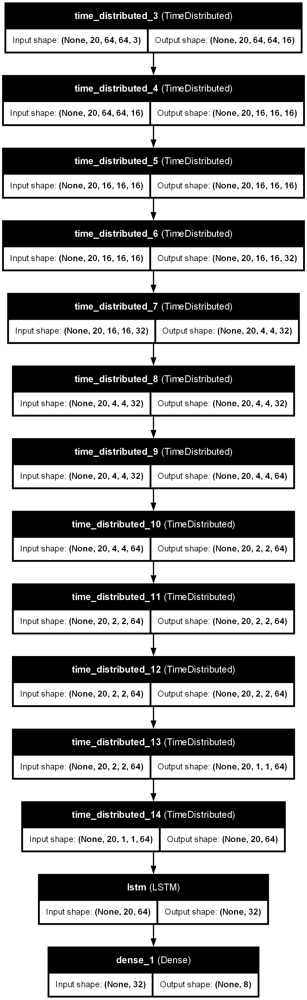

In [28]:

plot_model(LRCN_model, to_file = 'LRCN_model_structure_plot.png', show_shapes = True, show_layer_names = True)

### **<font style="color:rgb(134,19,348)">Step 4.2: Compile & Train the Model</font>**


In [29]:

early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)


LRCN_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])


LRCN_model_training_history = LRCN_model.fit(x = features_train, y = labels_train, epochs = 70, batch_size = 4 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/70
149/149 ━━━━━━━━━━━━━━━━━━━━ 79s 264ms/step - accuracy: 0.1711 - loss: 2.0455 - val_accuracy: 0.3624 - val_loss: 1.7520
Epoch 2/70
149/149 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - accuracy: 0.3467 - loss: 1.7299 - val_accuracy: 0.3960 - val_loss: 1.5577
Epoch 3/70
149/149 ━━━━━━━━━━━━━━━━━━━━ 33s 221ms/step - accuracy: 0.4047 - loss: 1.5501 - val_accuracy: 0.3893 - val_loss: 1.5776
Epoch 4/70
149/149 ━━━━━━━━━━━━━━━━━━━━ 34s 227ms/step - accuracy: 0.4665 - loss: 1.4461 - val_accuracy: 0.5436 - val_loss: 1.3230
Epoch 5/70
149/149 ━━━━━━━━━━━━━━━━━━━━ 42s 279ms/step - accuracy: 0.5018 - loss: 1.3525 - val_accuracy: 0.4564 - val_loss: 1.3902
Epoch 6/70
149/149 ━━━━━━━━━━━━━━━━━━━━ 46s 307ms/step - accuracy: 0.5709 - loss: 1.2429 - val_accuracy: 0.4899 - val_loss: 1.3244
Epoch 7/70
149/149 ━━━━━━━━━━━━━━━━━━━━ 35s 235ms/step - accuracy: 0.5837 - loss: 1.1426 - val_accuracy: 0.5973 - val_loss: 1.0763
Epoch 8/70
149/149 ━━━━━━━━━━━━━━━━━━━━ 34s 231ms/step - accuracy: 0.6407 - loss: 1

#### **<font style="color:rgb(134,19,348)">Evaluate the Trained Model</font>**

In [30]:

model_evaluation_history = LRCN_model.evaluate(features_test, labels_test)

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - accuracy: 0.7982 - loss: 0.6252


#### **<font style="color:rgb(134,19,348)">Save the Model</font>**

In [31]:

model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history


date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)


model_file_name = f'LRCN_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'


LRCN_model.save(model_file_name)

In [32]:
# from google.colab import drive
# drive.mount('/content/drive')


ModuleNotFoundError: No module named 'google.colab'

In [ ]:
# LRCN_model.save('/content/drive/MyDrive/my_model')


In [ ]:



# LRCN_model = tf.keras.models.load_model('/content/drive/MyDrive/my_model')


# LRCN_model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDist  (None, 20, 64, 64, 16)    448       
 ributed)                                                        
                                                                 
 time_distributed_1 (TimeDi  (None, 20, 16, 16, 16)    0         
 stributed)                                                      
                                                                 
 time_distributed_2 (TimeDi  (None, 20, 16, 16, 16)    0         
 stributed)                                                      
                                                                 
 time_distributed_3 (TimeDi  (None, 20, 16, 16, 32)    4640      
 stributed)                                                      
                                                                 
 time_distributed_4 (TimeDi  (None, 20, 4, 4, 32)      0

### **<font style="color:rgb(134,19,348)">Step 4.3: Plot Model’s Loss & Accuracy Curves</font>**


In [33]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):



    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]


    epochs = range(len(metric_value_1))


    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)


    plt.title(str(plot_name))


    plt.legend()

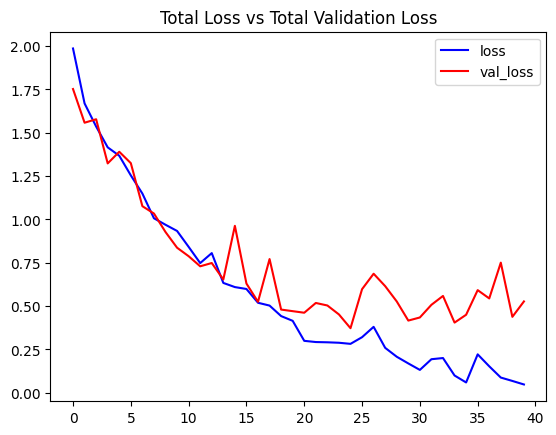

In [34]:

plot_metric(LRCN_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

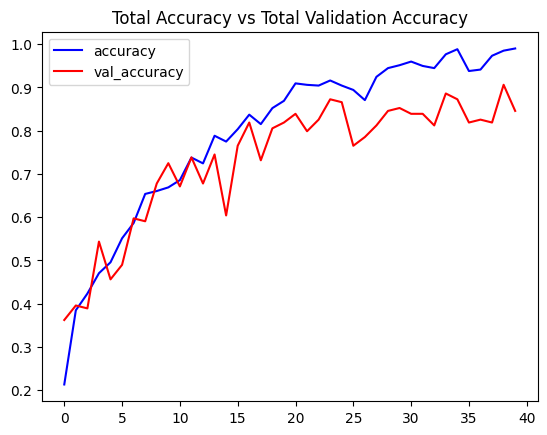

In [35]:

plot_metric(LRCN_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

## **<font style="color:rgb(134,19,348)">Step 6: Test the Best Performing Model on YouTube videos</font>**

### **<font style="color:rgb(134,19,348)">Create a Function to Download YouTube Videos:</font>**

In [36]:
def download_youtube_videos(youtube_video_url, output_directory):



     video = pafy.new(youtube_video_url)


     title = video.title


     video_best = video.getbest()


     output_file_path = f'{output_directory}/{title}.mp4'


     video_best.download(filepath = output_file_path, quiet = True)


     return title

In [37]:
pip install pytube


   ---------------------------------------- 0.0/57.6 kB ? eta -:--:--
   --------------------- ------------------ 30.7/57.6 kB 660.6 kB/s eta 0:00:01
   ---------------------------- ----------- 41.0/57.6 kB 281.8 kB/s eta 0:00:01
   ----------------------------------- ---- 51.2/57.6 kB 290.5 kB/s eta 0:00:01
   ---------------------------------------- 57.6/57.6 kB 253.2 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


**Download a Test Video**

In [38]:
import os
from pytube import YouTube


def download_youtube_video(url, output_dir):
    yt = YouTube(url)
    video = yt.streams.filter(file_extension='mp4', progressive=True).first()
    video.download(output_dir)
    return yt.title


test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)


video_title = download_youtube_video('https://www.youtube.com/watch?v=IkUFkSMllW8', test_videos_directory)


input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

print("Video downloaded successfully!")
print("Path to the downloaded video:", input_video_file_path)


Video downloaded successfully!
Path to the downloaded video: test_videos/Multiple Actions.mp4


### **<font style="color:rgb(134,19,348)"> Function To Perform a Single Prediction on Videos</font>**

In [39]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):



    video_reader = cv2.VideoCapture(video_file_path)


    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))


    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))


    frames_queue = deque(maxlen = SEQUENCE_LENGTH)


    predicted_class_name = ''


    while video_reader.isOpened():


        ok, frame = video_reader.read()


        if not ok:
            break


        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))


        normalized_frame = resized_frame / 255


        frames_queue.append(normalized_frame)


        if len(frames_queue) == SEQUENCE_LENGTH:


            predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_queue, axis = 0))[0]


            predicted_label = np.argmax(predicted_labels_probabilities)


            predicted_class_name = CLASSES_LIST[predicted_label]


        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)


        video_writer.write(frame)


    video_reader.release()
    video_writer.release()

In [40]:

output_video_file_path = f'{test_videos_directory}/{video_title}-Output-SeqLen{SEQUENCE_LENGTH}.mp4'


predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)


VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━

In [ ]:

import os
from pytube import YouTube


def download_youtube_video(url, output_dir):
    yt = YouTube(url)
    video = yt.streams.filter(file_extension='mp4', progressive=True).first()
    video.download(output_dir)
    return yt.title


test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)


video_title = download_youtube_video('https://www.youtube.com/watch?v=8u0qjmHIOcE', test_videos_directory)


input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

print("Video downloaded successfully!")
print("Path to the downloaded video:", input_video_file_path)






Video downloaded successfully!
Path to the downloaded video: test_videos/Test Video.mp4


In [ ]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):



    video_reader = cv2.VideoCapture(video_file_path)


    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))


    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                                   video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))


    frames_queue = deque(maxlen = SEQUENCE_LENGTH)


    predicted_class_name = ''


    while video_reader.isOpened():


        ok, frame = video_reader.read()


        if not ok:
            break


        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))


        normalized_frame = resized_frame / 255


        frames_queue.append(normalized_frame)


        if len(frames_queue) == SEQUENCE_LENGTH:


            predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_queue, axis = 0))[0]


            predicted_label = np.argmax(predicted_labels_probabilities)


            predicted_class_name = CLASSES_LIST[predicted_label]


        cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)


        video_writer.write(frame)


    video_reader.release()
    video_writer.release()

In [ ]:

output_video_file_path = f'{test_videos_directory}/{video_title}-Output-SeqLen{SEQUENCE_LENGTH}.mp4'


predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)


VideoFileClip(output_video_file_path, audio=False, target_resolution=(300,None)).ipython_display()

1/1 [==============================] - 0s 33ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t:  97%|█████████▋| 843/867 [00:02<00:00, 328.86it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/Test Video-Output-SeqLen20.mp4, 360000 bytes wanted but 0 bytes read,at frame 866/867, at time 31.04/31.04 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4
